# Satellite Image Data Analysis using numpy

## Data source: Satellite Image from WIFIRE

WIFIRE is an integrated system for wildfire analysis, with specific refard to changing urban dynamics and climate. The system integrates networked observations such as heterogeneous satellite data and real-time remote sensor data, with computational techniques in signal processing, visualization, modeling, and data assimilation to provide a scalable method to monitor such phenomena as weather patterns that can help predict a wildfire's rate of spread. You can read more about WIFIRE at https://wifire.ucsd.edu/

In this example, we will analyze a sample satellite image dataset from WIFIRE using the numpy Library.

## Loading the libraries we need: numpy, scipy, matplotlib

In [5]:
%matplotlib inline
import numpy as np
from scipy import misc
import matplotlib.pyplot as plt

## Creating a numpy array from an image file:

Lets choose a WIFIRE satellite image file as an ndarray and display its type.

In [6]:
from skimage import data
import imageio
photo_data = imageio.imread('./desktop/sd-3layers.jpg')

type(photo_data)

imageio.core.util.Image

Let's see what is in this image

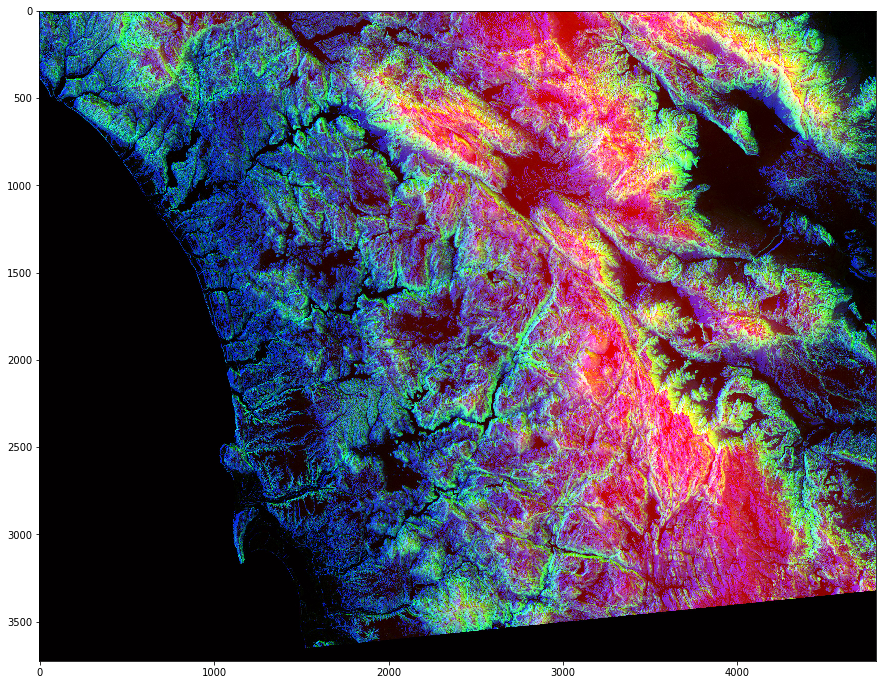

In [7]:
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

In [8]:
photo_data.shape

# print(photo_data)

(3725, 4797, 3)

The shapre of the ndarray show that it is a three layered matrix. The first two numbers here are length and width, and the third number(i.e. 3) is for three layers: Red, Green and Blue.

## RGB Color Mapping in the Photo:

* ##  Red pixel indicates Altitude
* ##  Blue pixel indicates Aspect
* ## Green pixel indicates Slope

The higher values denote higher altitude, aspect and slope.



In [9]:
photo_data.size

53606475

In [10]:
photo_data.min(), photo_data.max()

(0, 255)

In [11]:
photo_data.mean()

75.829935450894695

## Pixel on the 150th Row and 250th Column

In [12]:
photo_data[150, 250]

Image([ 17,  35, 255], dtype=uint8)

In [13]:
photo_data[150, 250, 1]

35

## Set a pixel to All Zeros

We can set all three layer in a pixel as once by assigning zero globally to the (row,column) pairing.
However, seting one pixel to zero is not noticeable.

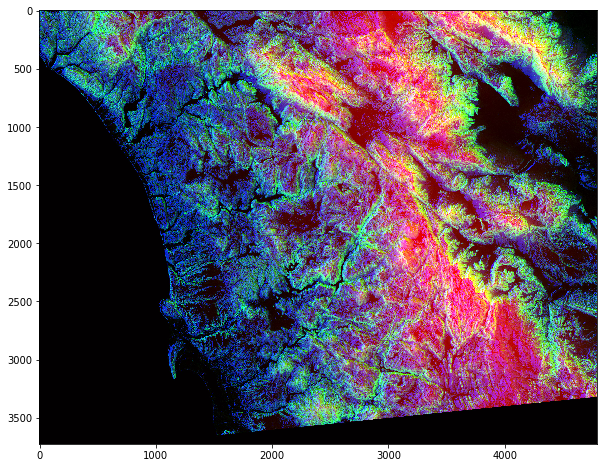

In [14]:
#photo_data = imageio.imread('./desktop/sd-3layers.jpg')
photo_data[150, 250] = 0
plt.figure(figsize=(10,10))
plt.imshow(photo_data)


## Changing colors in a Range

We can also use a range to change the pixel values. 

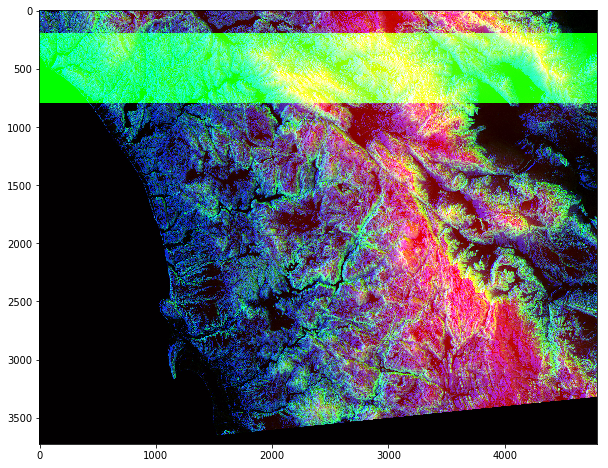

In [15]:
photo_data = imageio.imread('./desktop/sd-3layers.jpg')

photo_data[200:800, : ,1] = 255
plt.figure(figsize=(10,10))
plt.imshow(photo_data)

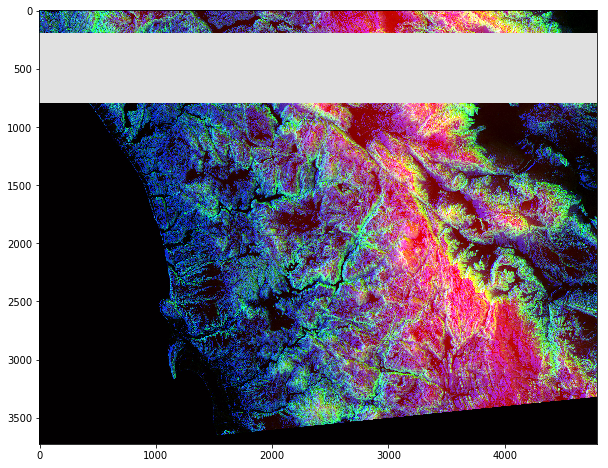

In [16]:
photo_data = imageio.imread('./desktop/sd-3layers.jpg')

photo_data[200:800, :] = 225
plt.figure(figsize=(10,10))
plt.imshow(photo_data)

## Pick all Pixels with Low Values

In [17]:
photo_data = imageio.imread('./desktop/sd-3layers.jpg')
print("Shape of photo_data:", photo_data.shape)
low_value_filter = photo_data < 200
print("Shape of low_value_filter:", low_value_filter.shape)

Shape of photo_data: (3725, 4797, 3)
Shape of low_value_filter: (3725, 4797, 3)


## Filtering out Low Values

Whenever the low_value_filter is True, set value to 0


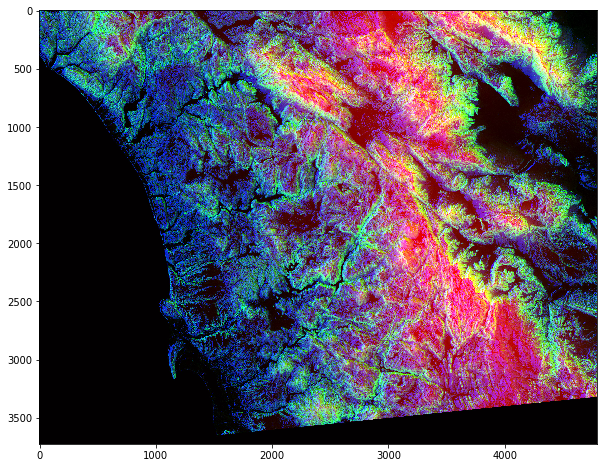

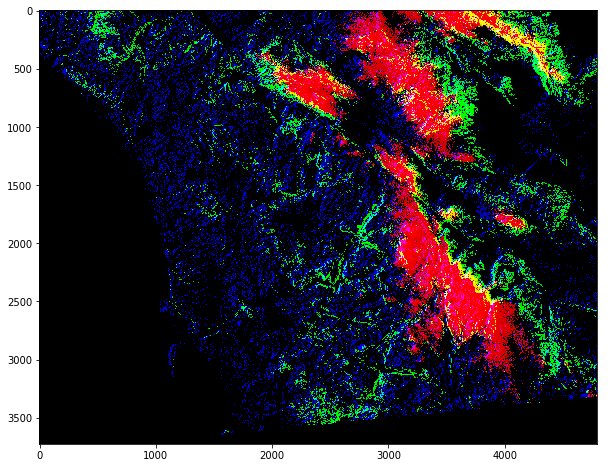

In [18]:
#import random
plt.figure(figsize=(10,10))
plt.imshow(photo_data)
photo_data[low_value_filter] = 0
plt.figure(figsize=(10,10))
plt.imshow(photo_data)

## More Row and Column Operations

You can design complex patterns by making cols a function of rows or vice-versa. Here we try a linear relationship between rows and columns.

In [19]:
rows_range = np.arange(len(photo_data))
cols_range = rows_range
print(type(rows_range))

<class 'numpy.ndarray'>


In [20]:
photo_data[rows_range, cols_range] = 255

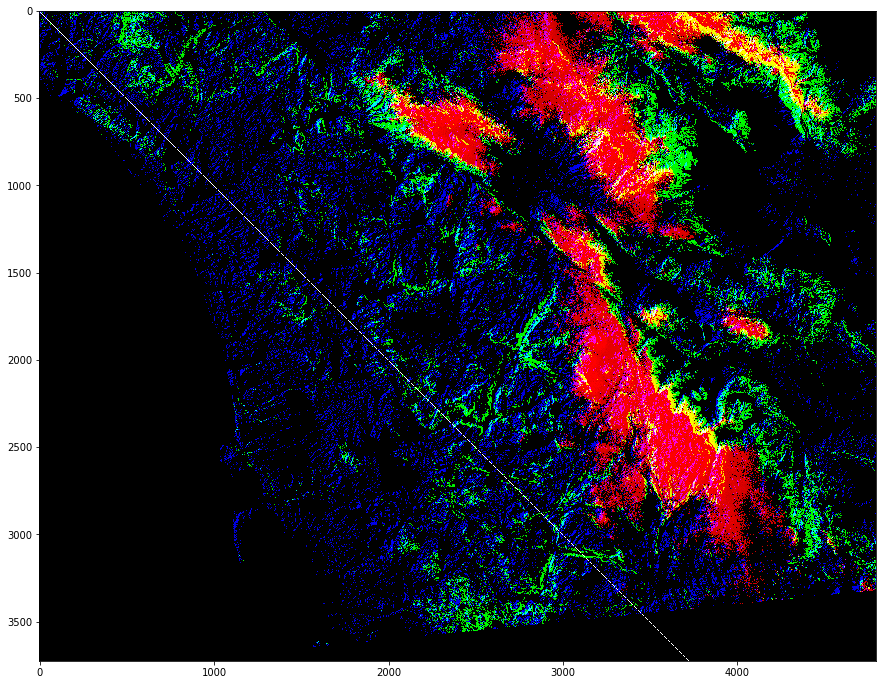

In [21]:
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

## Masking Images

Now let us try something even cooler...a mask that is in shape of a circular disc.

In [28]:
total_rows, total_cols, total_layers = photo_data.shape
#print("photo_data = ", photo_data.shape)

X, Y =np.ogrid[:total_rows, :total_cols]
#print("X = ", X.shape, " and Y = ", Y.shape)


In [31]:
center_row, center_col = total_rows / 2, total_cols / 2
#print("center_row = ", center_row, "AND center_col = ", center_col)
#print(X - center_row)
#print(Y - center_col)
dist_from_center = (X - center_row)**2 + (Y - center_col)**2
#print(dist_from_center)
radius = (total_rows / 2)**2
#print("Radius = ", radius)
circular_mask = (dist_from_center > radius)
#print(circular_mask)
print(circular_mask[1500:1700,2000:2200])

[[False False False ..., False False False]
 [False False False ..., False False False]
 [False False False ..., False False False]
 ..., 
 [False False False ..., False False False]
 [False False False ..., False False False]
 [False False False ..., False False False]]


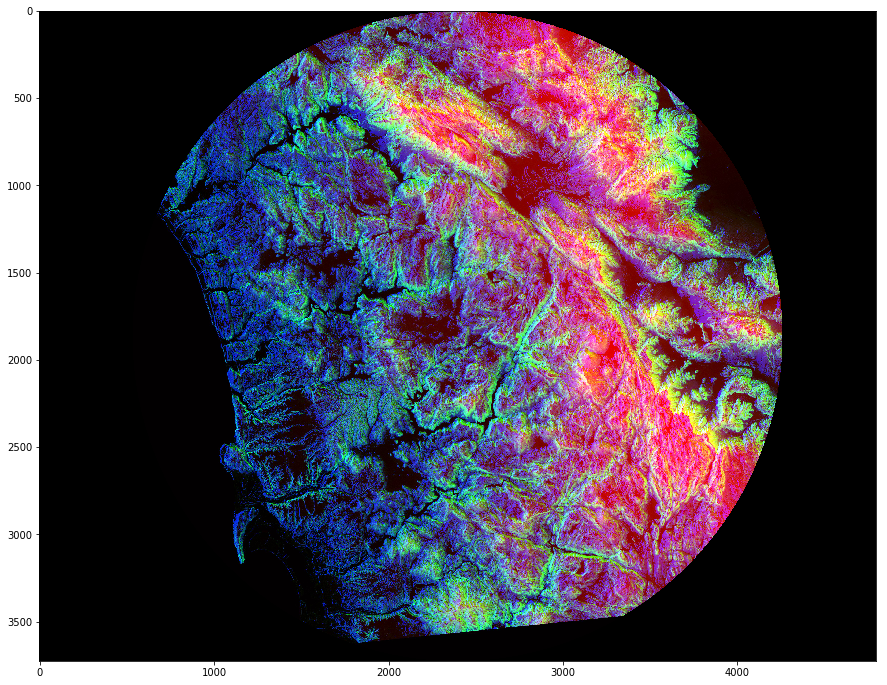

In [33]:
photo_data = imageio.imread('./desktop/sd-3layers.jpg')
photo_data[circular_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

## Further Masking

You can further the mask, for example just get upper half disc.

In [34]:
X, Y = np.ogrid[:total_rows, :total_cols]
half_upper = X < center_row # this line generates a mask for all rows above

half_upper_mask = np.logical_and(half_upper, circular_mask)

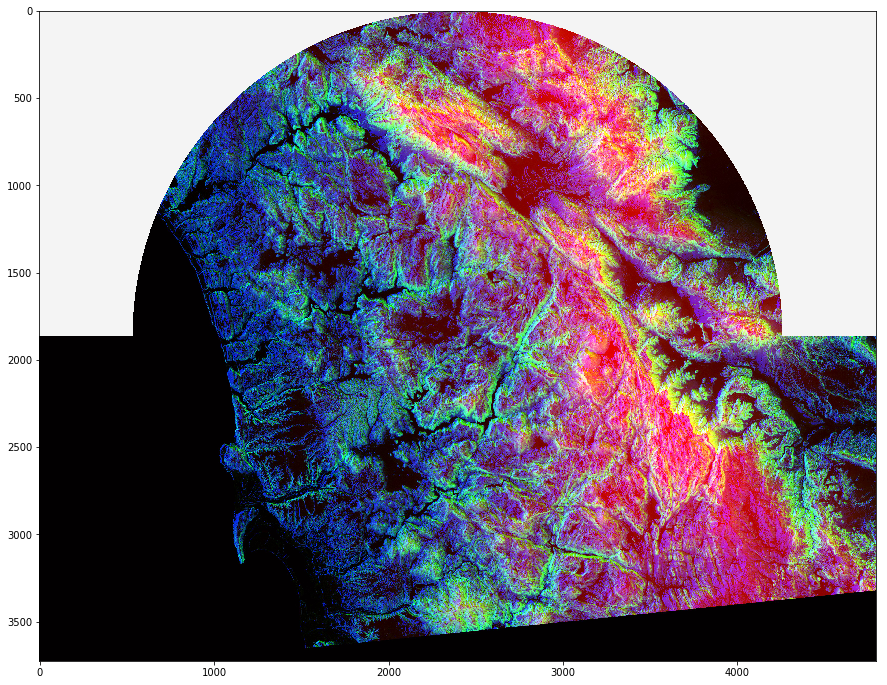

In [37]:
import random
photo_data = imageio.imread('./desktop/sd-3layers.jpg')
photo_data[half_upper_mask] = 255
photo_data[half_upper_mask] = random.randint(200,255)
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

# Further Processing of our Satellite Imagery

## Processing of RED Pixels

Remember that red pixels tell us about the height. Let us try to highlight all the high altitude areas. We will do this by detecting high intensity RED Pixels and muting down other areas.

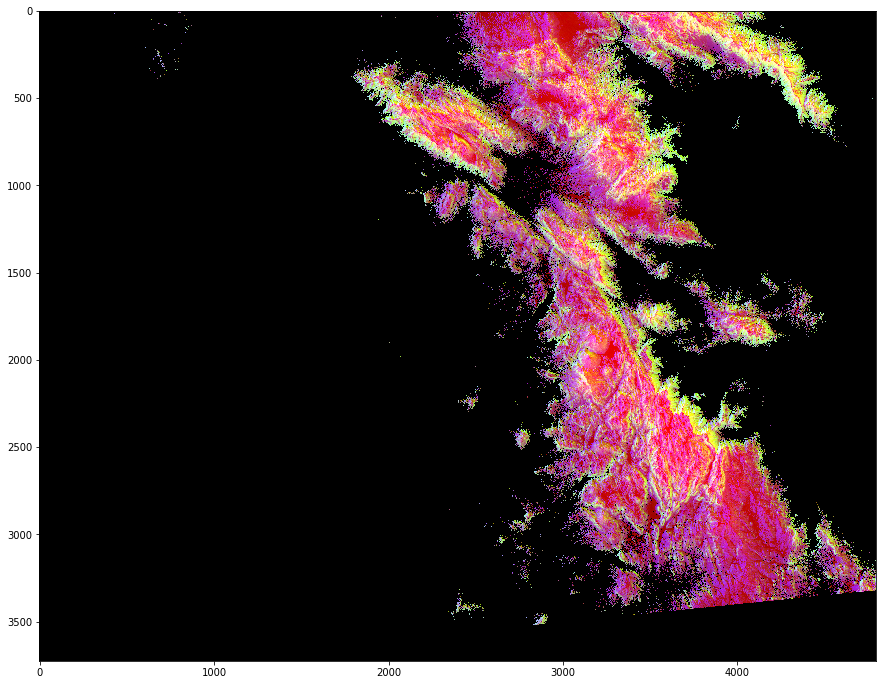

In [38]:
photo_data = imageio.imread('./desktop/sd-3layers.jpg')
red_mask = photo_data[:, :, 0] < 150

photo_data[red_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

## Detecting Highly-GREEN Pixels

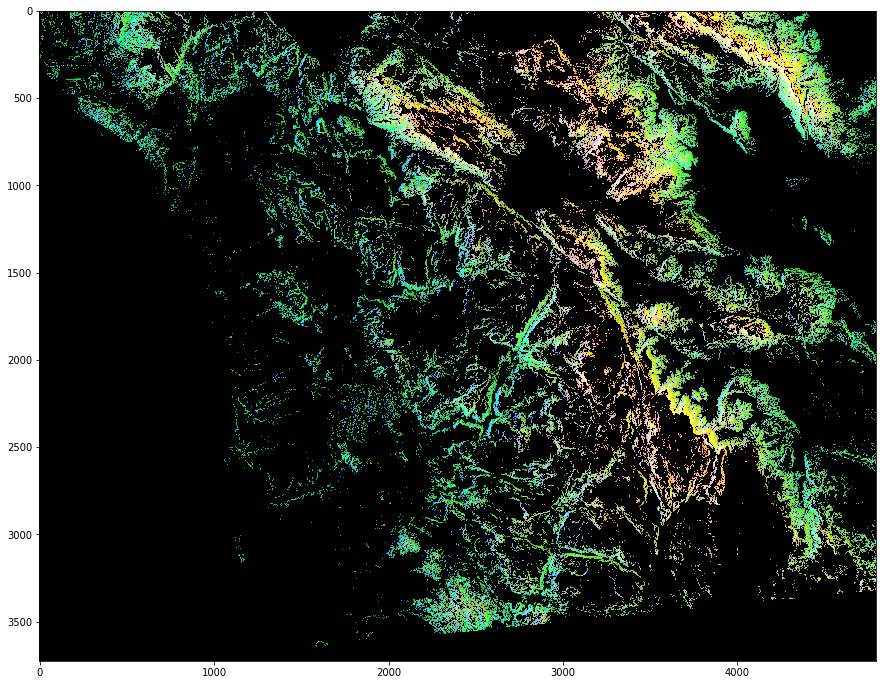

In [39]:
photo_data = imageio.imread('./desktop/sd-3layers.jpg')
red_mask = photo_data[:, :, 1] < 150

photo_data[red_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

# Detecting Highly-BLUE Pixels

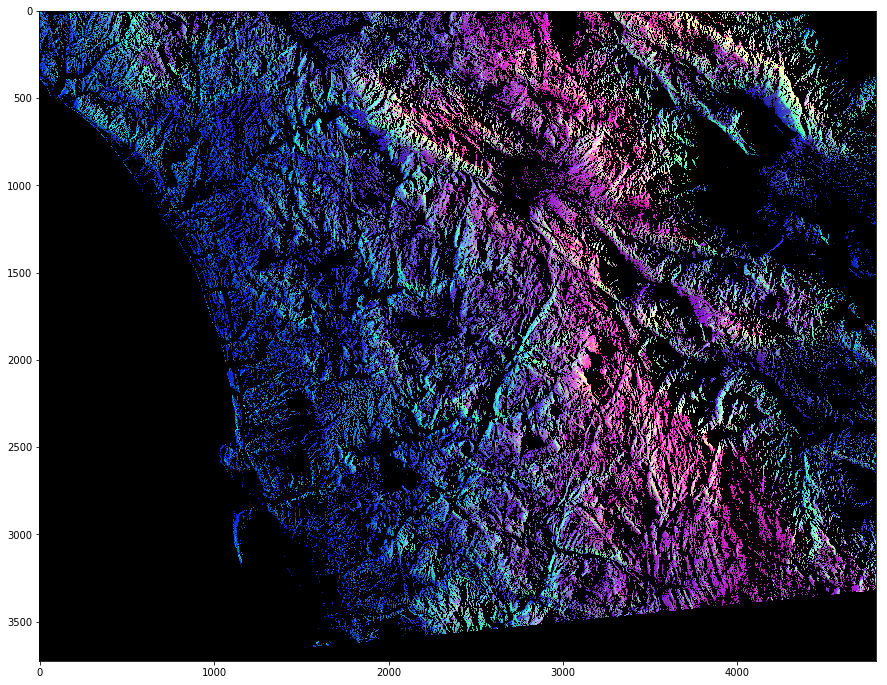

In [40]:
photo_data = imageio.imread('./desktop/sd-3layers.jpg')
red_mask = photo_data[:, :, 2] < 150

photo_data[red_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

## Composite mask that takes thresholds on all three layers: RED, GREEN, BLUE

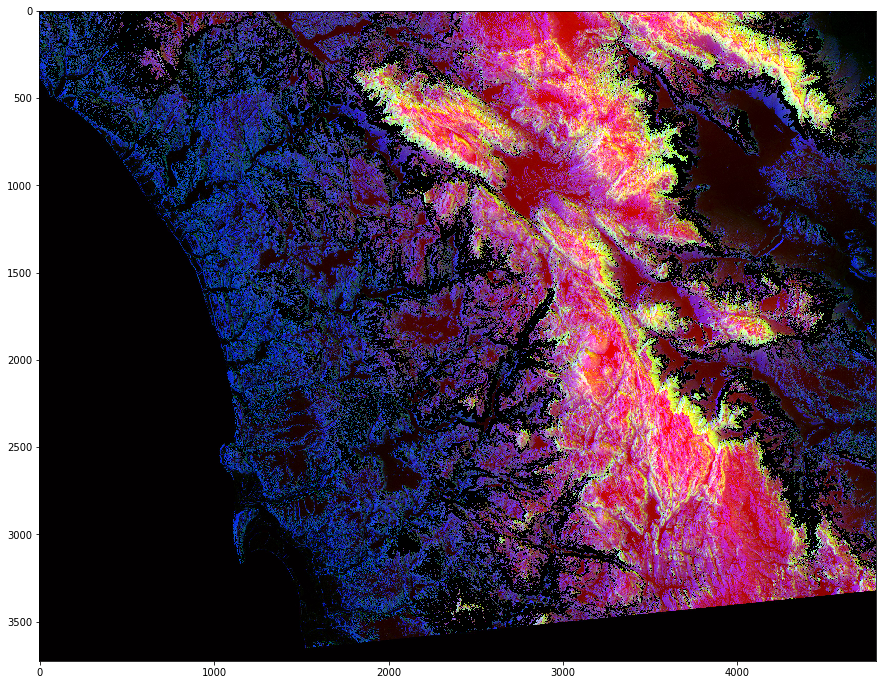

In [41]:
photo_data = imageio.imread('./desktop/sd-3layers.jpg')

red_mask = photo_data[:, : ,0] < 150
green_mask = photo_data[:, : ,1] > 100
blue_mask = photo_data[:, : ,2] < 100

final_mask = np.logical_and(red_mask, green_mask, blue_mask)
photo_data[final_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)